# MiloDE on Stat3

# To do:
- filter by CDR (not just minimum expression) <--- most important
- Use embryo as covariate instead of sample <--- 2nd most important
- Optimize Nhoods
- Downstream analysis (GO??)
- Set WGCNA filter for Nhoods genes are differential in to higher number (since more Nhoods present in the data)

In [4]:
suppressPackageStartupMessages({
    library(miloDE)
    library(scWGCNA)
    library(scuttle)
    suppressMessages(library(miloR))
    suppressMessages(library(uwot))
    library(scran)
    suppressMessages(library(dplyr))
    library(reshape2)
    suppressMessages(library(Seurat))
    library(ggplot2)
    library(viridis)
    library(ggpubr)
    library(BiocParallel)
    library(data.table)
    library(parallel)

})
ncores = 16
mcparam = MulticoreParam(workers = ncores)
register(mcparam)

In [5]:
main = "/rds/project/rds-SDzz0CATGms/users/bt392/01_Eomes_RNA/"
source(paste0(main, "code/settings.R"))
source(paste0(main, "code/utils.R"))

args = list() 
args$outdir = file.path(main, 'results/rna/MiloDE/')
args$metadata <- paste0(main,"/results/rna/mapping/sample_metadata_after_mapping.txt.gz")
args$sce <- '/rds/project/rds-SDzz0CATGms/users/bt392/01_Eomes_RNA/processed/SingleCellExperiment.rds'
args$stage = 'E8.5'
args$tdTom_corr = 'False'
dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

test = FALSE

In [6]:
sample_metadata <- fread(args$metadata) %>%
   .[pass_rnaQC==TRUE & doublet_call==FALSE & stage %in% args$stage] %>%
    .[,pool:=stringr::str_replace_all(sample,opts$sample2pool)]


if(args$tdTom_corr!='True'){
    sample_metadata = sample_metadata[tdTom==tdTom_corr]
}

if(test){
    sample_metadata = sample_metadata[sample(1:nrow(sample_metadata), nrow(sample_metadata)/10)]
}

###############
## Load data ##
###############

# Load RNA expression data as SingleCellExperiment object
sce <- load_SingleCellExperiment(args$sce, cells=sample_metadata$cell, normalise = TRUE)

# Add sample metadata as colData
colData(sce) <- sample_metadata %>% tibble::column_to_rownames("cell") %>% DataFrame

In [7]:
sce

class: SingleCellExperiment 
dim: 29453 32368 
metadata(0):
assays(2): counts logcounts
rownames(29453): Xkr4 Gm1992 ... CAAA01147332.1 tomato-td
rowData names(0):
colnames(32368): SLX-20795_SITTA11_HKTG2DRXY#AAACCCAGTTCTCTAT-1
  SLX-20795_SITTA11_HKTG2DRXY#AAACGCTAGTGATTCC-1 ...
  SLX-20795_SITTH11_HKTG2DRXY#TTTGTTGCAATGAGCG-1
  SLX-20795_SITTH11_HKTG2DRXY#TTTGTTGCATATGCGT-1
colData names(21): sample barcode ... closest.cell_mnn pool
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

In [8]:
# Get PCA
args$pca_file = '/rds/project/rds-SDzz0CATGms/users/bt392/01_Eomes_RNA/results/rna/dimensionality_reduction/no_ExE/sce/sample/pca_features2500_pcs40.txt.gz'

pca = fread(args$pca_file)[cell %in% colnames(sce)]

sce = sce[,pca$cell]
pca = pca[match(colnames(sce), cell)] %>% tibble::column_to_rownames("cell") %>% as.matrix
reducedDim(sce,"PCA") = pca
args$npcs = dim(pca)[2]

In [9]:
# Get UMAP
meta_atlas <- fread(io$rna.atlas.metadata)
umap.dt <- meta_atlas %>%
    .[,c("cell","umapX","umapY")] %>%
    setnames(c('cell', 'UMAP1', 'UMAP2')) %>%
    .[match(sce$closest.cell_mnn, cell)] %>%
    .[, cell := colnames(sce)]

umap = umap.dt[match(colnames(sce), cell)] %>% tibble::column_to_rownames("cell") %>% as.matrix
reducedDim(sce,"UMAP") = umap

In [10]:
# Filter genes
# Get gene metadata
gene_metadata <- fread(io$gene_metadata) %>% .[,c("chr","ens_id","symbol")] %>%
  .[symbol!="" & ens_id%in%rownames(sce)] %>%
  .[!duplicated(symbol)]

# Imprinted genes
imprint = gene_metadata[c(grep('maternally', gene_metadata$description),
                       grep('paternally', gene_metadata$description)), symbol]

genes_keep = rownames(sce) %>%
    .[grep("^Rik|Rik$|^mt-|^Rps|^Rpl|^Gm",.,invert=T)] %>% # filter out non-informative genes
#    .[grep("^Hbb|^Hba",rn,invert=T)] %>% # Removing Haem genes due to spilling over from erythroids to other cells 
    .[!. %in% c(imprint, 'Grb10', 'Nnat')] %>%  # remove imprinted genes
    .[!. %in% c("Xist", "Tsix")] %>%  # remove Xist & Tsix
    .[!.=="tomato-td"] %>% # remove tomato itself
    .[!.%in%gene_metadata[chr=="chrY",symbol]]

sce = sce[genes_keep,]

In [11]:
args$cdr_threshold = 0.05
CDR = data.table(gene = rownames(sce),
                 cdr_WT = rowMeans(counts(sce[,colData(sce)$tdTom_corr==FALSE])>0),
                 cdr_KO = rowMeans(counts(sce[,colData(sce)$tdTom_corr==TRUE])>0)) %>%
    .[order(-cdr_WT)] %>%
    .[,pass_CDR := ifelse(cdr_WT > args$cdr_threshold | cdr_KO > args$cdr_threshold, TRUE, FALSE)]

sce_filt = sce[CDR[pass_CDR==TRUE, gene], ]

In [9]:
sce_filt

class: SingleCellExperiment 
dim: 9594 31398 
metadata(0):
assays(2): counts logcounts
rownames(9594): Ptma Actb ... Cyct Ankrd31
rowData names(0):
colnames(31398): SLX-20795_SITTA11_HKTG2DRXY#AAACCCAGTTCTCTAT-1
  SLX-20795_SITTA11_HKTG2DRXY#AAACGCTAGTGATTCC-1 ...
  SLX-20795_SITTH11_HKTG2DRXY#TTTGTTGCAATGAGCG-1
  SLX-20795_SITTH11_HKTG2DRXY#TTTGTTGCATATGCGT-1
colData names(21): sample barcode ... closest.cell_mnn pool
reducedDimNames(2): PCA UMAP
mainExpName: RNA
altExpNames(0):

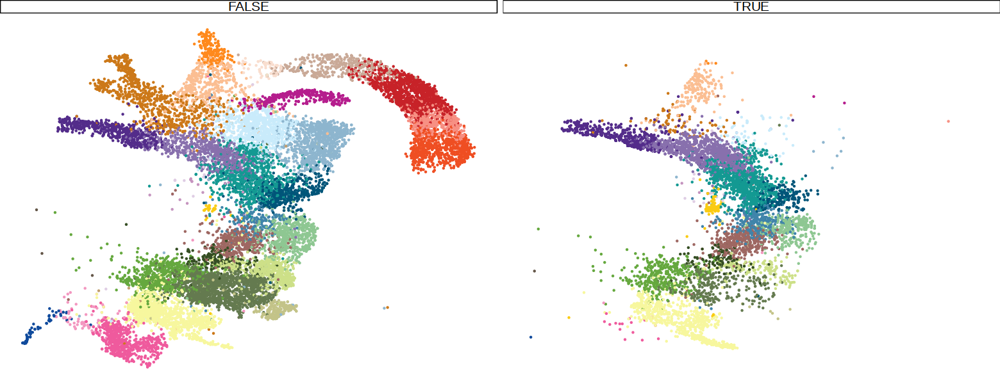

In [13]:
options(repr.plot.height=5, repr.plot.width=13)
# plot UMAPs, colored by cell types
umaps = cbind(as.data.frame(colData(sce)), umap)

p = ggplot(umaps , aes(x = UMAP1, y = UMAP2 , col = celltype.mapped_mnn)) +
  geom_point(size=0.2) + 
  scale_color_manual(values=opts$celltype.colors, name='') +
  facet_wrap(~tdTom) +
  theme_void() + 
  theme(legend.position='none',
       strip.background=element_rect(fill=NA),
       text=element_text(size=15)) + 
  labs(x = "UMAP-1", y = "UMAP-2")
p

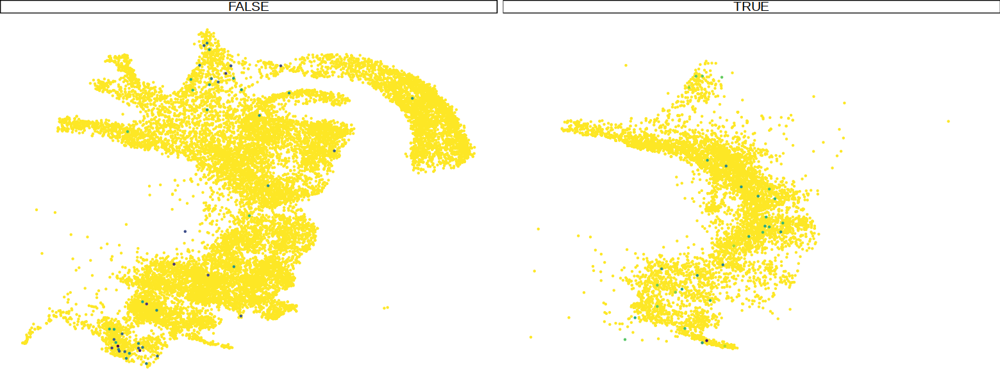

In [19]:
tmp = as.data.table(umaps) %>% .[,gene := as.vector(logcounts(sce['Vsig2',]))] %>% 
    .[order(gene)]
p = ggplot(tmp , aes(x = UMAP1, y = UMAP2 , col = gene)) +
  geom_point(size=0.2) + 
  viridis::scale_color_viridis(begin=1, end=0) +
  facet_wrap(~tdTom) +
  theme_void() + 
  theme(legend.position='none',
       strip.background=element_rect(fill=NA),
       text=element_text(size=15)) + 
  labs(x = "UMAP-1", y = "UMAP-2")
p

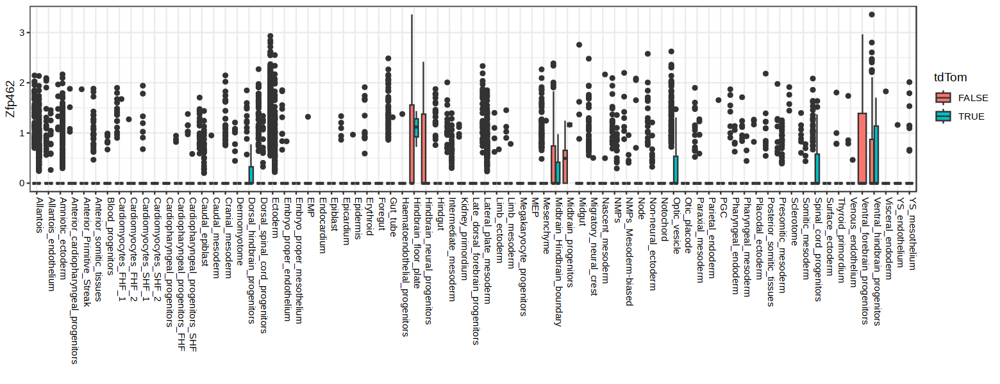

In [16]:
ggplot(tmp, aes(celltype_extended.mapped_mnn, gene, fill=tdTom)) + 
    geom_boxplot() +
    xlab('') + ylab('Zfp462') +
    theme_bw() + 
    theme(text = element_text(color='black'),
          axis.text = element_text(color='black'),
          axis.text.x = element_text(angle=-90, hjust=0, vjust=0))

In [88]:
test = fread(file.path(io$basedir, 'results/rna/differential/celltype_extended.mapped_mnn/DEresults_stageE8.5_tdTom_corrFalse_pseudobulk.txt.gz'))

In [89]:
head(test[gene=='Zfp462'][order(-sig)])

logFC,logCPM,F,PValue,padj_fdr,gene,variable,stage,sig
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>
0.25502521,5.820840,3.39307150,0.07629003,0.1818417,Zfp462,Allantois,E8.5,FALSE
0.24562578,4.532533,0.31238358,0.58281619,0.8682775,Zfp462,Allantois_endothelium,E8.5,FALSE
0.24265607,7.590538,1.98517403,0.16738691,0.5133303,Zfp462,Amniotic_ectoderm,E8.5,FALSE
-0.10029654,5.973199,0.71469946,0.40325177,0.6340945,Zfp462,Caudal_epiblast,E8.5,FALSE
-0.05918405,6.551864,0.03816244,0.84512151,0.9691361,Zfp462,Dorsal_spinal_cord_progenitors,E8.5,FALSE
0.08110958,6.578644,0.97409965,0.32897683,0.5140230,Zfp462,Ectoderm,E8.5,FALSE


Running for next k values:
10, 15, 20, 25, 30, 35, 40



100% covered by 385 sets.


Finished for k = 10



100% covered by 241 sets.


Finished for k = 15



100% covered by 174 sets.


Finished for k = 20



100% covered by 139 sets.


Finished for k = 25



100% covered by 109 sets.


Finished for k = 30

Warning message in (function (to_check, X, clust_centers, clust_info, dtype, nn, :
“detected tied distances to neighbors, see ?'BiocNeighbors-ties'”


100% covered by 98 sets.


Finished for k = 35

Warning message in (function (to_check, X, clust_centers, clust_info, dtype, nn, :
“detected tied distances to neighbors, see ?'BiocNeighbors-ties'”


100% covered by 89 sets.


Finished for k = 40

Finished the estimation of neighbourhood sizes ~ k dependancy (order = 2).



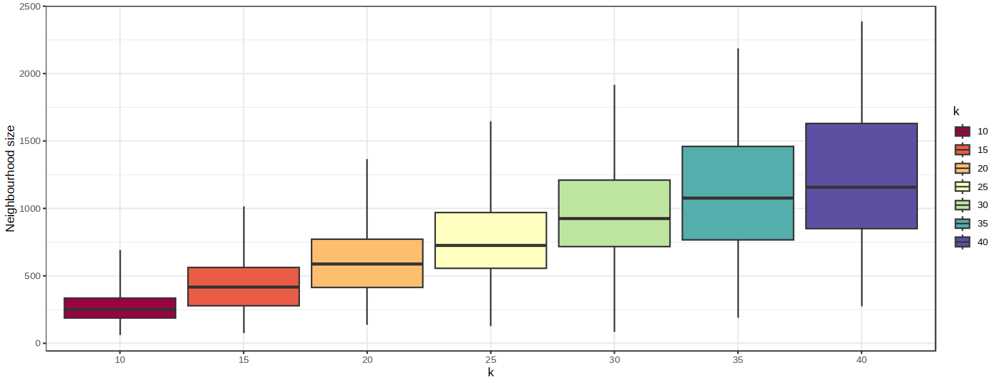

In [11]:
stat_k = estimate_neighbourhood_sizes(sce, k_grid = seq(10,40,5) , 
                                      order = 2, prop = 0.2 , filtering = TRUE,
                                      reducedDim_name = "PCA" , plot_stat = TRUE)

In [12]:
knitr::kable(stat_k , caption = "Neighbourhood size distribution ~ k")



Table: Neighbourhood size distribution ~ k

|k  | min|    q25|    med|     q75|  max|
|:--|---:|------:|------:|-------:|----:|
|10 |  59| 187.00|  253.0|  335.00|  694|
|15 |  76| 278.00|  419.0|  562.00| 1014|
|20 | 136| 414.00|  588.5|  771.75| 1365|
|25 | 126| 556.00|  726.0|  969.50| 1645|
|30 |  83| 717.00|  927.0| 1210.00| 1918|
|35 | 187| 766.75| 1077.5| 1459.75| 2189|
|40 | 273| 850.00| 1156.0| 1630.00| 2386|

In [13]:
set.seed(32)
# What does order mean here?
sce_milo = assign_neighbourhoods(sce , k = 30, prop = 0.2, order = 2, 
                                 filtering = TRUE , reducedDim_name = "PCA" , verbose = F)
saveRDS(sce_milo, file.path(args$outdir, 'sce_milo.rds'))

#> 100% covered by 42 sets.

100% covered by 107 sets.


Converting celltype.mapped_mnn to factor...

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


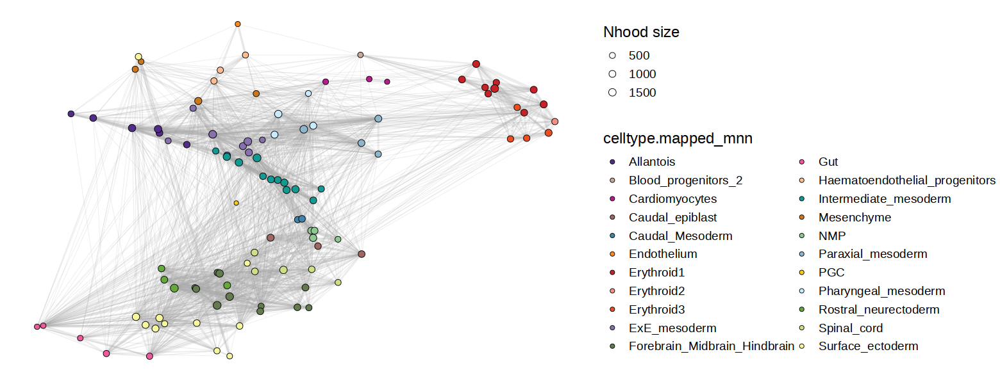

In [14]:
nhoods_sce = nhoods(sce_milo)
# assign cell types for nhoods 
nhood_stat_ct = data.frame(Nhood = 1:ncol(nhoods_sce) , Nhood_center = colnames(nhoods_sce))
nhood_stat_ct = miloR::annotateNhoods(sce_milo , nhood_stat_ct , coldata_col = "celltype.mapped_mnn")
#> Converting seurat_clusters to factor...
p = plot_milo_by_single_metric(sce_milo, nhood_stat_ct, colour_by = "celltype.mapped_mnn" , 
                                      layout = "UMAP" , size_range = c(1.5,3) , edge_width = c(0.2,0.5)) + 
  scale_fill_manual(values = opts$celltype.colors , name = "celltype.mapped_mnn")
p

In [15]:
stat_auc = suppressWarnings(calc_AUC_per_neighbourhood(sce_milo , sample_id = "sample" , condition_id = "tdTom", min_n_cells_per_sample = 20, BPPARAM = mcparam))
saveRDS(stat_auc, file.path(args$outdir, 'stat_auc.rds'))

p = plot_milo_by_single_metric(sce_milo, stat_auc, colour_by = "auc" , 
                                      layout = "UMAP" , size_range = c(1.5,3) , edge_width = c(0.2,0.5)) + 
  scale_fill_viridis(name = "AUC")

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


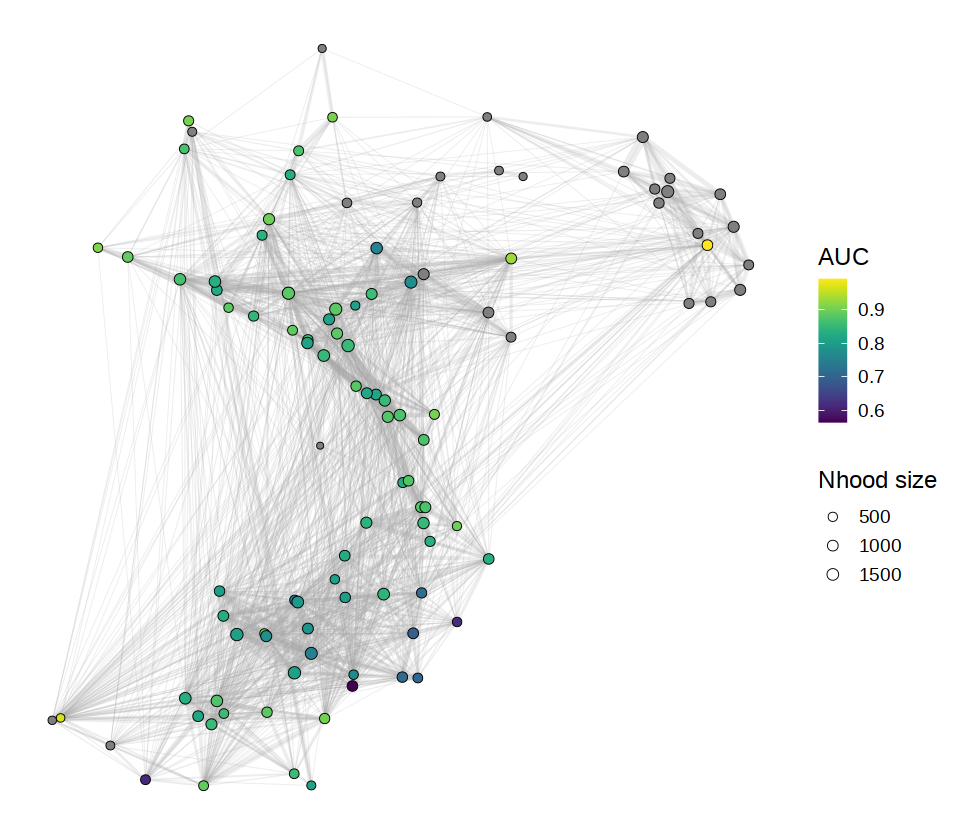

In [16]:
options(repr.plot.height=7, repr.plot.width=8)
p

DE testing is done.
80 neighbourhoods (out of 80) were tested.

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


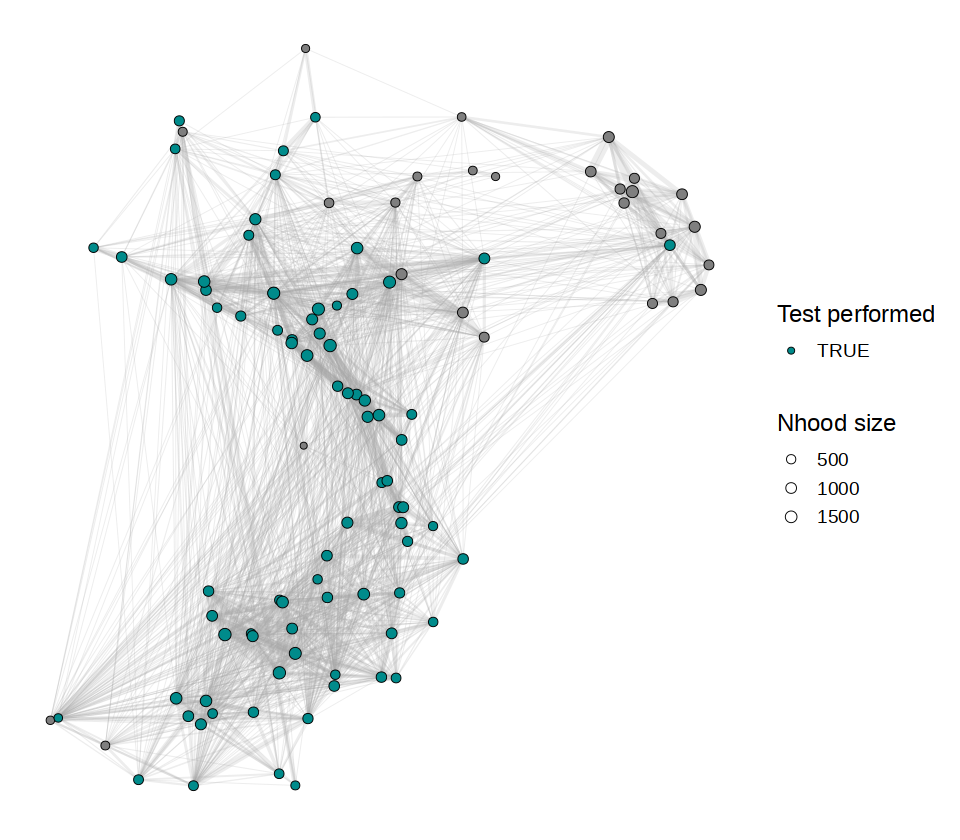

In [17]:
set.seed(7)
BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 24

de_stat = de_test_neighbourhoods(sce_milo ,
                             sample_id = "sample",
                             design = ~ pool + tdTom_corr,
                             covariates = c('pool', "tdTom_corr"), # why covariate same as design?
                             min_count = 150,
                             subset_nhoods = stat_auc$Nhood[!is.na(stat_auc$auc)],
                             output_type = "SCE",
                             plot_summary_stat = TRUE,
                             layout = "UMAP", BPPARAM = BPPARAM, 
                             verbose = F)

saveRDS(de_stat, file.path(args$outdir, 'de_stat.rds'))

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


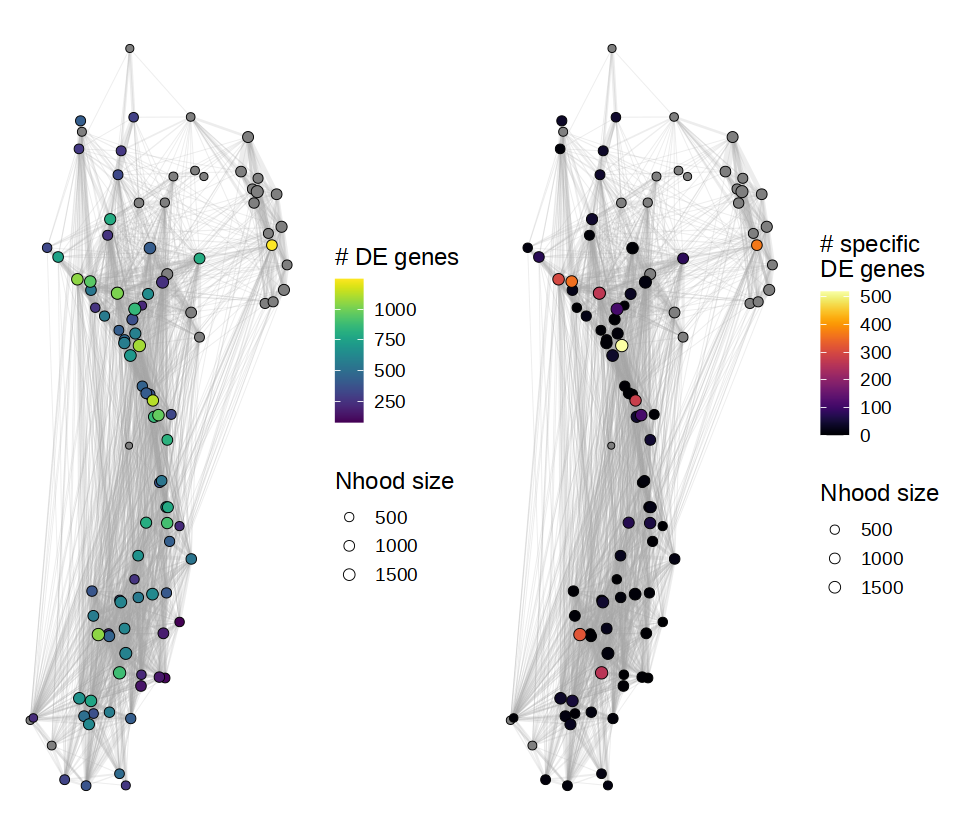

In [18]:
stat_de_magnitude = rank_neighbourhoods_by_DE_magnitude(de_stat)

p1 = plot_milo_by_single_metric(sce_milo, stat_de_magnitude, colour_by = "n_DE_genes" , 
                                      layout = "UMAP" , size_range = c(1.5,3) , edge_width = c(0.2,0.5)) + 
  scale_fill_viridis(name = "# DE genes")
#> Warning in plot_milo_by_single_metric(sce_milo, stat_de_magnitude, colour_by =
#> "n_DE_genes", : Coercing layout to matrix format
#> Scale for 'fill' is already present. Adding another scale for 'fill', which
#> will replace the existing scale.
p2 = plot_milo_by_single_metric(sce_milo, stat_de_magnitude, colour_by = "n_specific_DE_genes" , 
                                      layout = "UMAP" , size_range = c(1.5,3) , edge_width = c(0.2,0.5)) + 
  scale_fill_viridis(name = "# specific\nDE genes" , option = "inferno")
#> Warning in plot_milo_by_single_metric(sce_milo, stat_de_magnitude, colour_by =
#> "n_specific_DE_genes", : Coercing layout to matrix format
#> Scale for 'fill' is already present. Adding another scale for 'fill', which
#> will replace the existing scale.
p = ggarrange(p1,p2)
p

Warning message in mclapply(genes, function(gene) {:
“scheduled core 1 encountered error in user code, all values of the job will be affected”
Warning message in as_grob.default(plot):
“Cannot convert object of class try-error into a grob.”


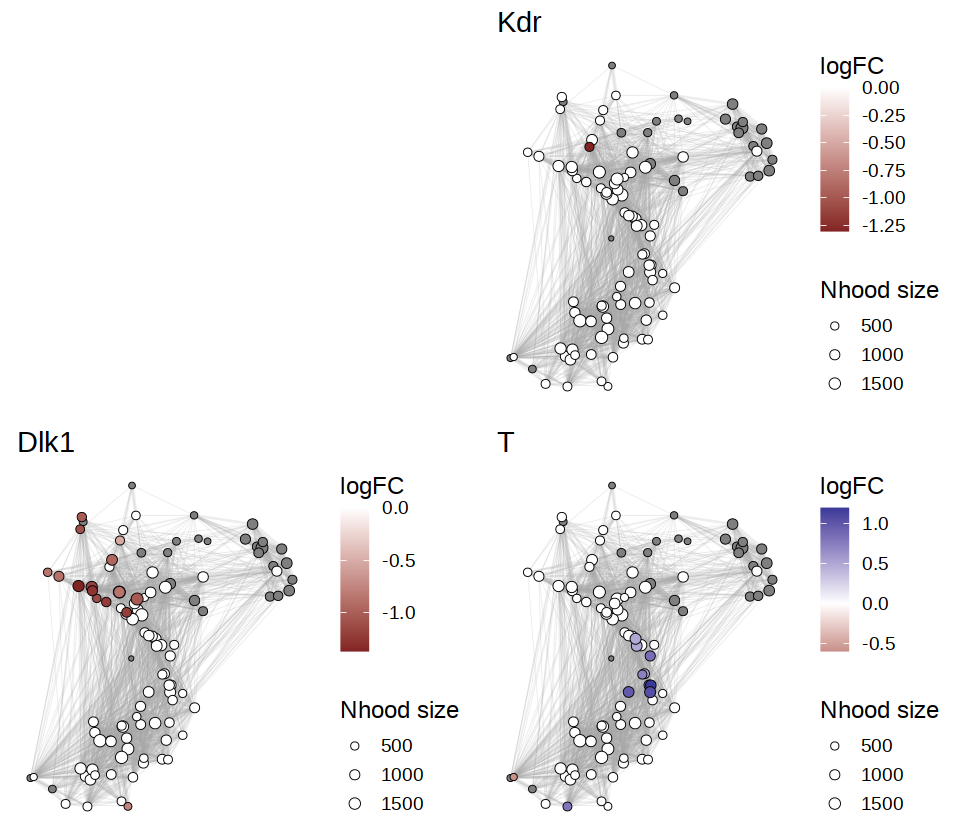

In [19]:
genes = c('Mixl1', 'Kdr', 'Dlk1', 'T')
plots = mclapply(genes , function(gene){
  p = plot_DE_single_gene(sce_milo, de_stat , gene = gene , layout = "UMAP" , set_na_to_0 = TRUE) + 
    ggtitle(gene)
  return(p)
}, mc.cores=4)

p = ggarrange(plotlist = plots, ncol=2, nrow=2)
p

In [20]:
get_wgcna_modules = function(de_stat , subset_hoods = NULL , 
                             n_hoods_sig.thresh = 2 ,
                             npcs = 5 ,
                             pval.thresh = 0.1 ){
  require(scWGCNA)
  require(Seurat)
  require(dplyr)
  require(reshape2)
  
  set.seed(32)
  # subset hoods
  if (!is.null(subset_hoods)){
    de_stat = de_stat[de_stat$Nhood %in% subset_hoods , ]
  }
  
  # focus on genes that DE in at least 2 nhoods
  de_stat_per_gene = as.data.frame(de_stat %>% group_by(gene) %>% dplyr::summarise(n_hoods_sig = sum(pval_corrected_across_nhoods < pval.thresh , na.rm = TRUE)))
  genes_sig = de_stat_per_gene$gene[de_stat_per_gene$n_hoods_sig >= n_hoods_sig.thresh]
  
  de_stat = de_stat[de_stat$gene %in% genes_sig, ]
  de_stat = de_stat[order(de_stat$Nhood) , ]
  
  # discard neighbourhoods in which testing was not performed
  de_stat = de_stat[de_stat$test_performed , ]
  
  # for this analysis, set logFC to 0 and pvals to 1 if they are NaN
  de_stat$logFC[is.na(de_stat$logFC)] = 0
  de_stat$pval[is.na(de_stat$pval)] = 1
  de_stat$pval_corrected_across_genes[is.na(de_stat$pval_corrected_across_genes)] = 1
  de_stat$pval_corrected_across_nhoods[is.na(de_stat$pval_corrected_across_nhoods)] = 1
  
  # set logFC to 0 if pval_corrected_across_nhoods > pval.thresh
  de_stat$logFC[de_stat$pval_corrected_across_nhoods >= pval.thresh] = 0
  
  # move the object to Seurat
  de_stat = reshape2::dcast(data = de_stat, formula = gene~Nhood, value.var = "logFC")
  rownames(de_stat) = de_stat$gene
  de_stat = de_stat[,2:ncol(de_stat)]
  
  obj.seurat <- CreateSeuratObject(counts = de_stat)
  DefaultAssay(obj.seurat) <- "RNA"
  obj.seurat = FindVariableFeatures(obj.seurat)
  # scale
  obj.seurat[["RNA"]]@scale.data = as.matrix(obj.seurat[["RNA"]]@data)
  obj.seurat = RunPCA(obj.seurat , npcs = npcs)
  
  # run scwgcna
  clusters_scwgcna = run.scWGCNA(p.cells = obj.seurat, 
                                 s.cells = obj.seurat, 
                                 is.pseudocell = F, 
                                 features = rownames(obj.seurat),
                                 less = TRUE , merging = TRUE)
  # compile stat
  clusters = lapply(1:length(clusters_scwgcna$module.genes) , function(i){
    out = data.frame(cluster = i , gene = clusters_scwgcna$module.genes[[i]] , n_genes = length(clusters_scwgcna$module.genes[[i]]))
    return(out)
  })
  clusters = do.call(rbind , clusters)
  # add colors
  genes_w_colors = clusters_scwgcna$dynamicCols
  genes_w_colors = data.frame(gene = names(genes_w_colors) , cluster_color = genes_w_colors)
  clusters = merge(clusters , genes_w_colors)
  
  return(clusters)
}


Warning message in eval(predvars, data, env):
“NaNs produced”
Warning message in hvf.info$variance.expected[not.const] <- 10^fit$fitted:
“number of items to replace is not a multiple of replacement length”


[1] "We have 1883 genes in the variable genes object"


Warning message:
“executing %dopar% sequentially: no parallel backend registered”
Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”
Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'y'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


   Power SFT.R.sq  slope truncated.R.sq mean.k. median.k. max.k.
1      1   0.0201 -11.80          0.827  942.00   941.000  961.0
2      2   0.6990 -13.40          0.840  499.00   493.000  558.0
3      3   0.7630  -5.85          0.831  278.00   269.000  360.0
4      4   0.8000  -3.64          0.845  163.00   153.000  252.0
5      5   0.8840  -2.70          0.896   99.60    90.200  190.0
6      6   0.9390  -2.24          0.944   64.10    54.900  152.0
7      7   0.9560  -1.97          0.954   43.20    34.700  127.0
8      8   0.9650  -1.79          0.963   30.50    22.800  109.0
9      9   0.9700  -1.66          0.965   22.40    15.300   95.9
10    10   0.9640  -1.57          0.958   17.10    10.500   85.8
11    12   0.9760  -1.45          0.970   10.80     5.420   70.7
12    14   0.9850  -1.39          0.984    7.49     2.990   59.9
13    16   0.9850  -1.36          0.983    5.51     1.760   51.6
14    18   0.9830  -1.34          0.981    4.24     1.110   45.0
15    20   0.9710  -1.32 

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9682  .... my.Clsize:  15"
40 genes not assigned to any module.
312 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9662  .... my.Clsize:  15"
20 genes not assigned to any module.
75 genes excluded due to significance.

IMPORTANT NOTE!!!
You have run this analysis witht the option less=TRUE. If a module seems to be highly expressed in only 1-3 cells ( cells expressing >2*(max(expression)/3) ), it will be removed.


Warning message in min(x, na.rm = T):
“no non-missing arguments to min; returning Inf”



Info: Some clusters will be merged
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 28 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 24 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 24 module eigengenes in given set.
The following modules were only highly expressed in less than 3 cells :  black, blue, brown, cyan, darkorange, darkturquoise, lightcyan, lightgreen, midnightblue, white
They will all be removed

This is the result of the filtering.
The color of the modules does not correspond between original and filtered
TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9609  .... my.Clsize:  12"


IMPORTANT NOTE!!!
You have run this analysis witht the option merging=TRUE. This means that based on their expression pattern, modules with similar expression profile (distance < 0.25) be merged during the iterations.
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 18 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 14 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 14 module eigengenes in given set.
0 genes not assigned to any module.
19 genes ex

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9603  .... my.Clsize:  12"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 17 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 15 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 15 module eigengenes in given set.
0 genes not assigned to any module.
7 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9602  .... my.Clsize:  12"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 17 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 15 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 15 module eigengenes in given set.
0 genes not assigned to any module.
0 genes excluded due to significance.

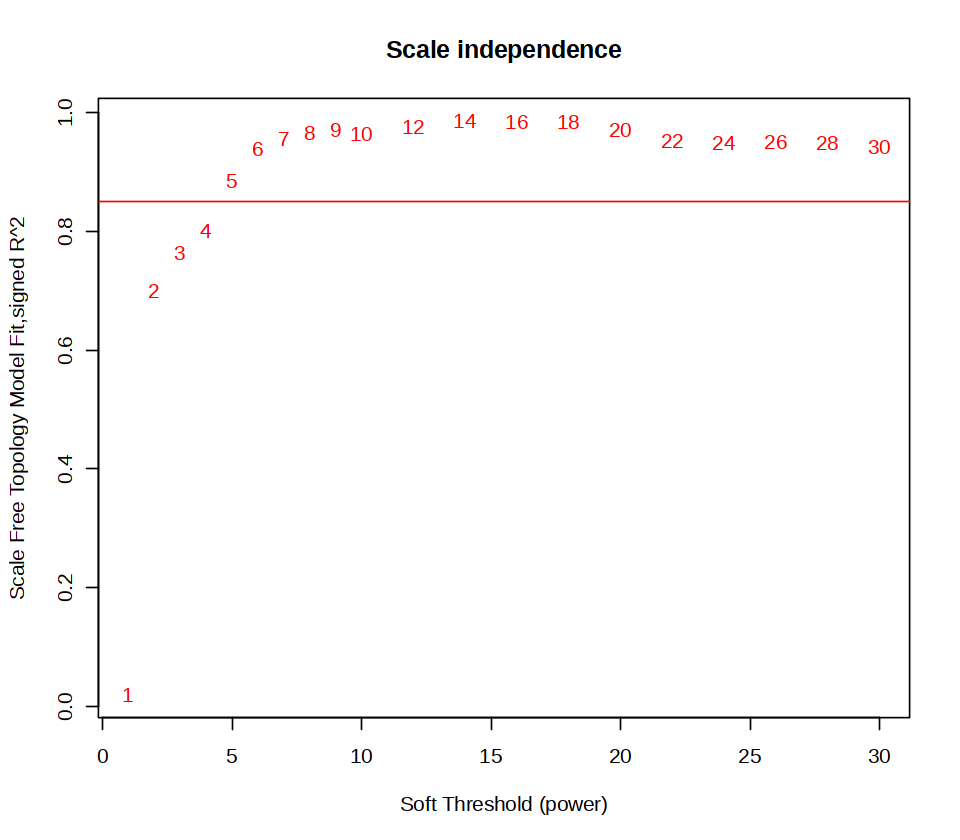

In [21]:
# for this vignette, for simplicity we will focus on genes that are DE in at least 4 neighbourhoods
modules_wgcna = suppressMessages(get_wgcna_modules(convert_de_stat(de_stat) , n_hoods_sig.thresh = 2, pval.thresh = 0.1))

In [22]:
fwrite(modules_wgcna, sprintf('%s/modules_wgcna.txt.gz', args$outdir))

### Analyse

In [23]:
sce_milo = readRDS(sprintf('%s/sce_milo.rds', args$outdir))
stat_auc = readRDS(sprintf('%s/stat_auc.rds', args$outdir))
de_stat = readRDS(sprintf('%s/de_stat.rds', args$outdir))
modules_wgcna = fread(sprintf('%s/modules_wgcna.txt.gz', args$outdir))


In [24]:
plots = mclapply(sort(unique(modules_wgcna$cluster)) , function(cluster){
  p = plot_DE_gene_set(sce_milo, de_stat , genes = modules_wgcna$gene[modules_wgcna$cluster == cluster],
                            layout = "UMAP" , size_range = c(0.5,3) ,
                            node_stroke = 0.3, edge_width = c(0.2,0.5)) +
    ggtitle(paste0("Module ", cluster, ", ", length(modules_wgcna$gene[modules_wgcna$cluster == cluster]) , " genes"))
  return(p)
}, mc.cores=10)

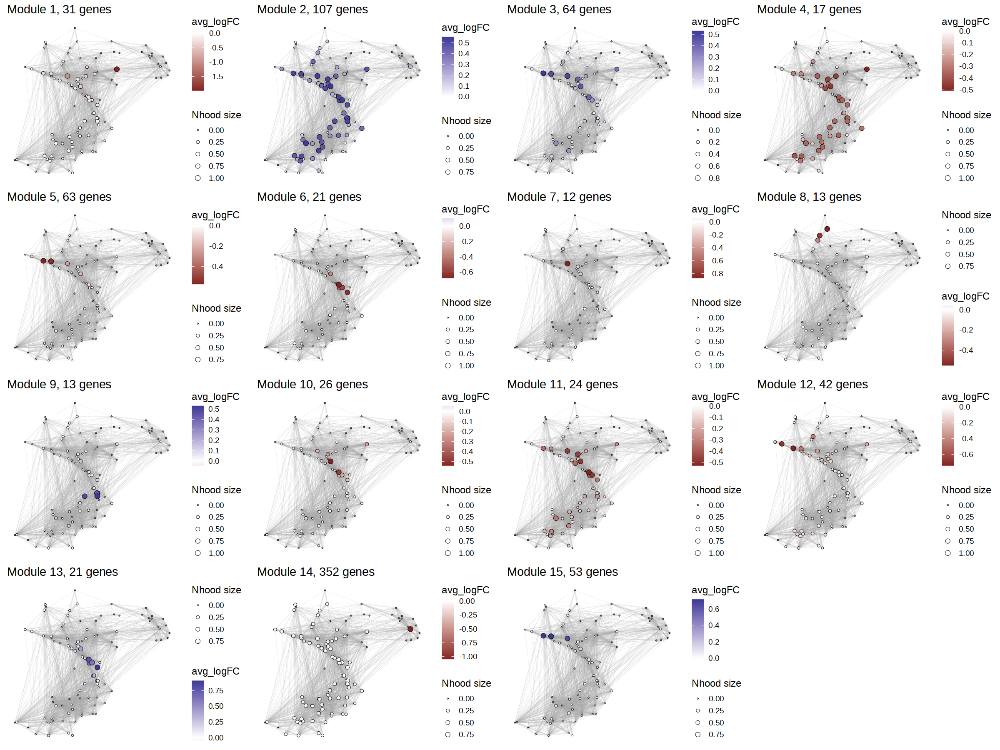

In [25]:
options(repr.plot.height=15, repr.plot.width=20)
p = ggarrange(plotlist = plots)
p

In [26]:
nhoods_sce = nhoods(sce_milo)
# assign cell types for nhoods 
nhood_stat_ct = data.frame(Nhood = 1:ncol(nhoods_sce) , Nhood_center = colnames(nhoods_sce))
nhood_stat_ct = miloR::annotateNhoods(sce_milo , nhood_stat_ct , coldata_col = "celltype.mapped_mnn")

Converting celltype.mapped_mnn to factor...



Converting de_stat to 'data.frame' format



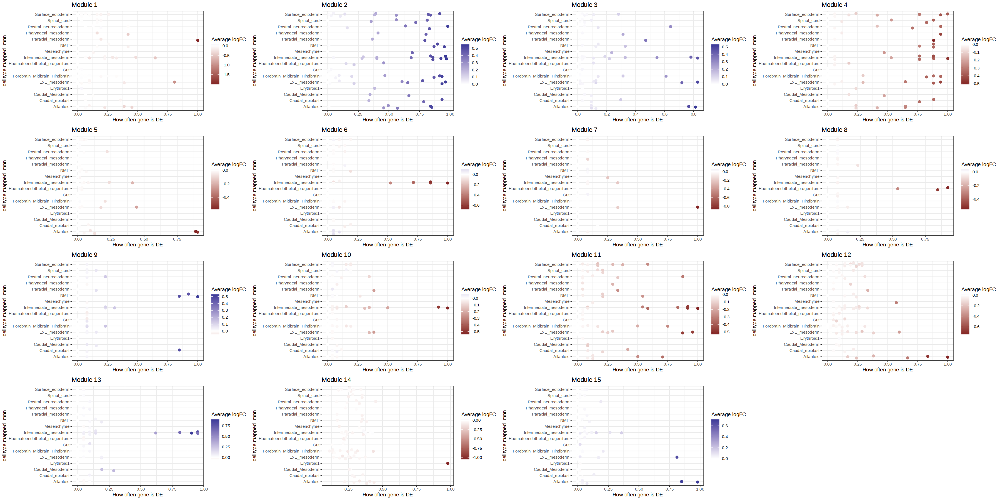

In [27]:
# we first need to assign cell type label to each neighbourhood - we have calculated it previously
# we will use data.frame format for de-stat; the conversion between SingleCellExperiment and data.frame formats can be done using `convert_de_stat`
de_stat_df = convert_de_stat(de_stat)
#> Converting de_stat to 'data.frame' format
de_stat_df = merge(de_stat_df , nhood_stat_ct , by = c("Nhood" , "Nhood_center"))


plots = mclapply(sort(unique(modules_wgcna$cluster)) , function(cluster){
  p = plot_beeswarm_gene_set(de_stat_df, 
                             genes = modules_wgcna$gene[modules_wgcna$cluster == cluster], 
                             nhoodGroup = "celltype.mapped_mnn") + 
    ggtitle(paste0("Module ", cluster))
  return(p)
}, mc.cores=12)
p = ggarrange(plotlist = plots)
options(repr.plot.height=15, repr.plot.width=30)
p

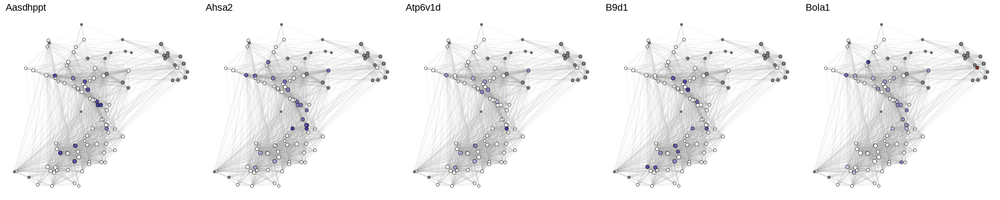

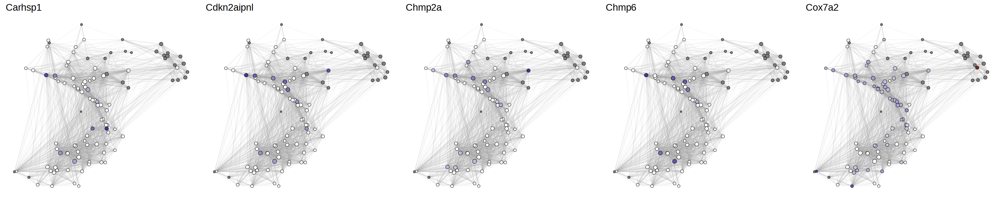

$`1`

$`2`

$`3`

$`4`

attr(,"class")
[1] "list"      "ggarrange"

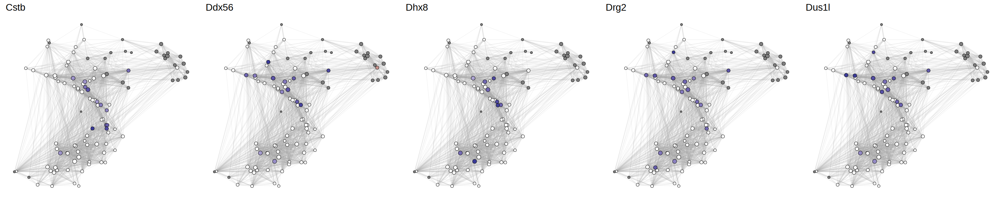

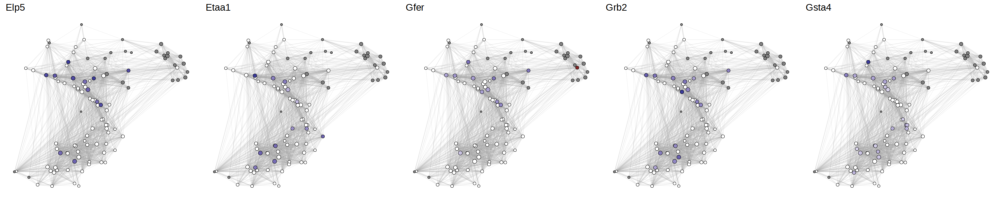

In [47]:
genes = head(modules_wgcna[modules_wgcna$cluster == 3,]$gene, 20)

plots = mclapply(genes , function(gene){
  p = suppressWarnings(plot_DE_single_gene(sce_milo, de_stat , gene = gene , layout = "UMAP" , set_na_to_0 = TRUE)) + 
    ggtitle(gene) + theme(legend.position='none')
  return(p)
}, mc.cores=10)

options(repr.plot.height=5, repr.plot.width=25)
p = ggarrange(plotlist = plots , ncol = 5) 
p

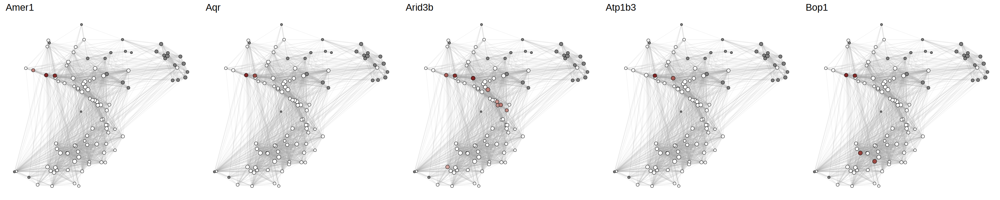

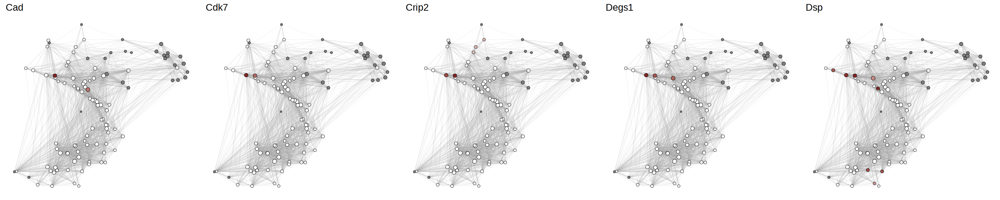

$`1`

$`2`

$`3`

$`4`

attr(,"class")
[1] "list"      "ggarrange"

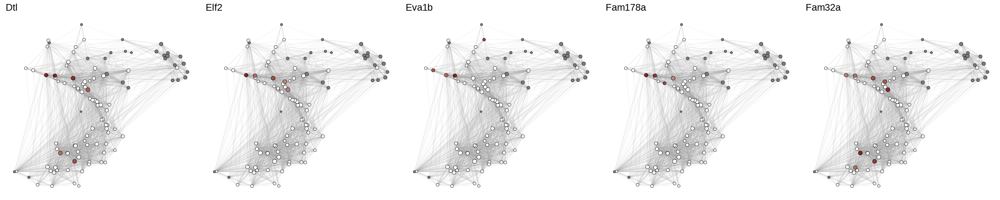

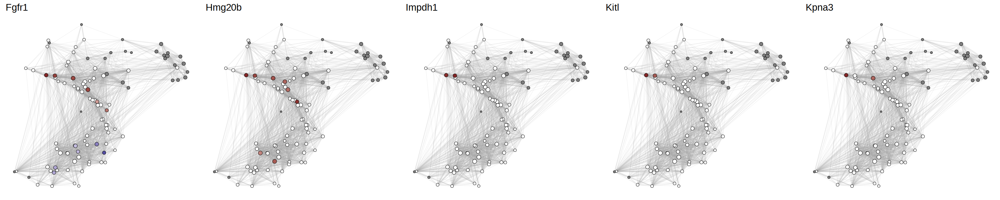

In [29]:
genes = head(modules_wgcna[modules_wgcna$cluster == 5,]$gene, 20)

plots = mclapply(genes , function(gene){
  p = suppressWarnings(plot_DE_single_gene(sce_milo, de_stat , gene = gene , layout = "UMAP" , set_na_to_0 = TRUE)) + 
    ggtitle(gene) + theme(legend.position='none')
  return(p)
}, mc.cores=10)

options(repr.plot.height=5, repr.plot.width=25)
p = ggarrange(plotlist = plots , ncol = 5) 
p

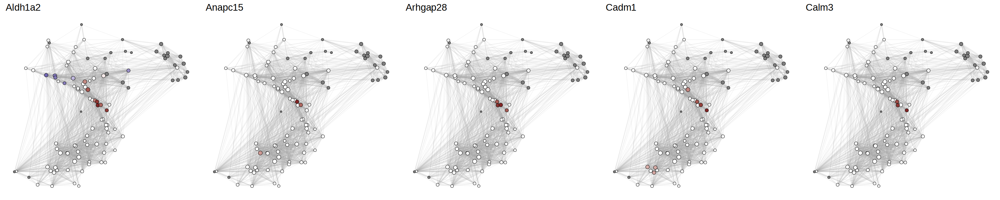

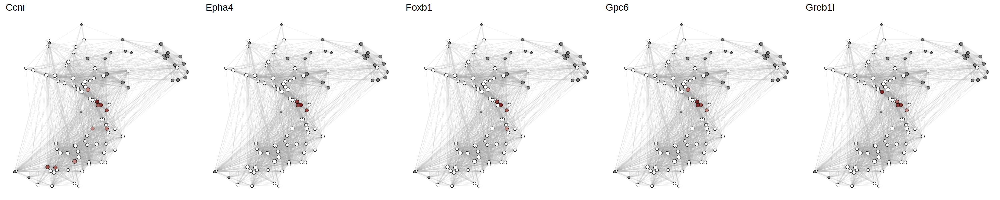

$`1`

$`2`

$`3`

$`4`

attr(,"class")
[1] "list"      "ggarrange"

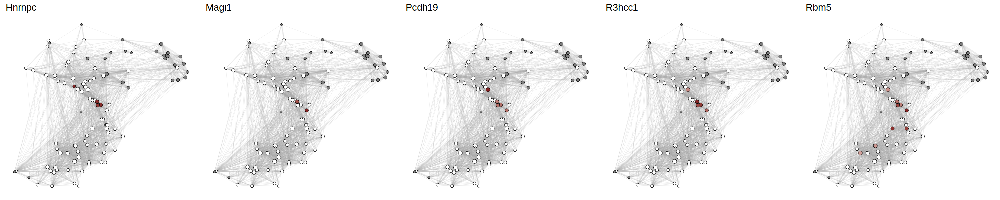

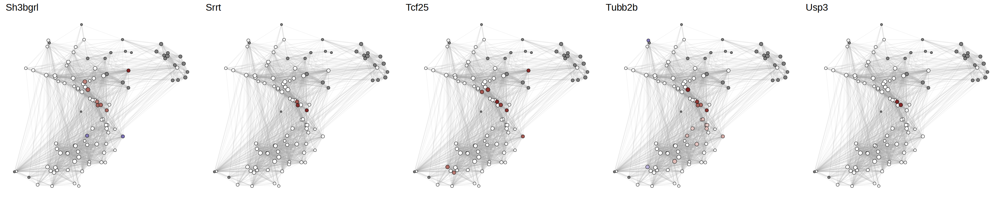

In [30]:
genes = head(modules_wgcna[modules_wgcna$cluster == 6,]$gene, 20)

plots = mclapply(genes , function(gene){
  p = suppressWarnings(plot_DE_single_gene(sce_milo, de_stat , gene = gene , layout = "UMAP" , set_na_to_0 = TRUE)) + 
    ggtitle(gene) + theme(legend.position='none')
  return(p)
}, mc.cores=10)

options(repr.plot.height=5, repr.plot.width=25)
p = ggarrange(plotlist = plots , ncol = 5) 
p

In [31]:
#fwrite(DEGs.dt, sprintf('%s/module_genes.csv', args$outdir))

# Gene Ontology
Filter:
- low P-value
- Number of genes

Welcome to enrichR
Checking connection ... 

Enrichr ... 
Connection is Live!

FlyEnrichr ... 
Connection is available!

WormEnrichr ... 
Connection is available!

YeastEnrichr ... 
Connection is available!

FishEnrichr ... 
Connection is available!

OxEnrichr ... 
Connection is available!



Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.


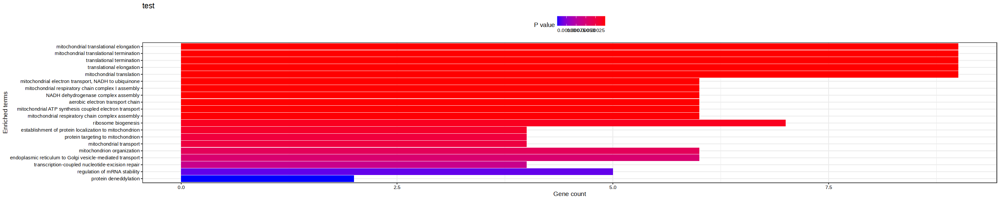

Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.


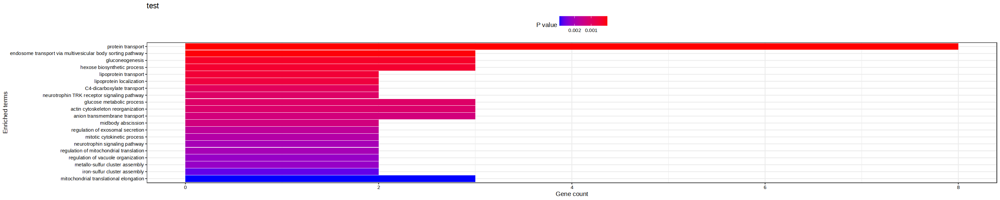

Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.


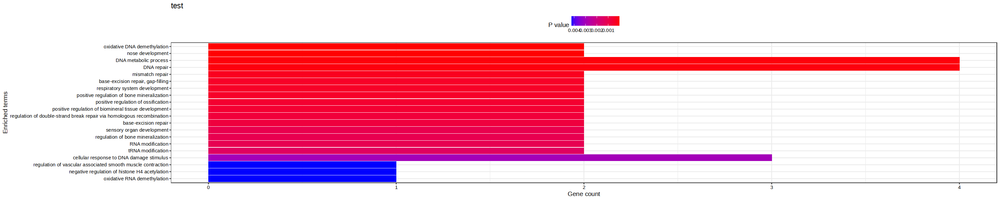

Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.


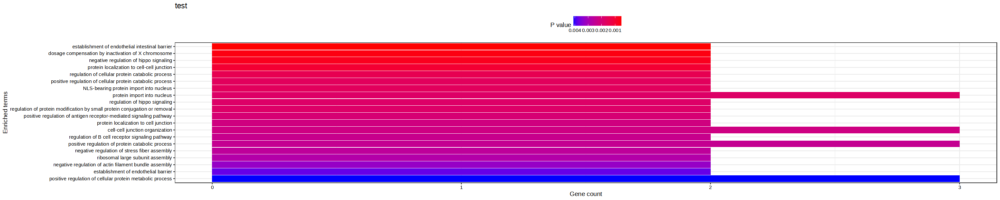

Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.


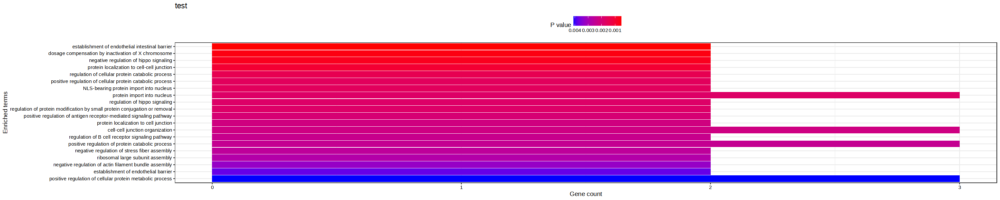

Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.


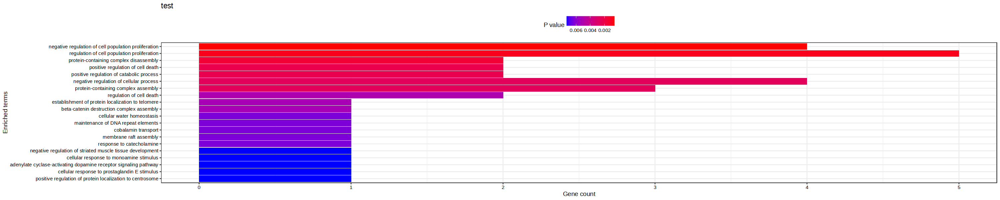

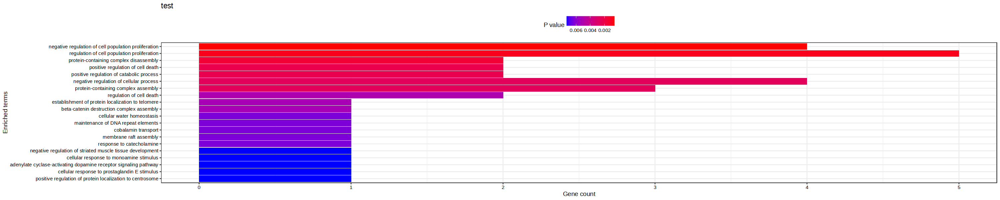

In [32]:
# output also says which genes belong to each ontology


get_go_terms = function(genes){
  library(enrichR)
  library(stringr)
  gos <- as.data.frame( enrichr(genes, 'GO_Biological_Process_2021')[[1]] )
  gos$n_tested_genes = length(genes)
  gos$n_detected_genes_in_go = NaN
  gos$n_total_genes_in_go = NaN
  gos$Term_id = NaN
  for (i in 1:nrow(gos)){
    current.overlap = gos$Overlap[i]
    current.overlap = str_split(current.overlap, '/')
    gos$n_detected_genes_in_go[i] = as.numeric(current.overlap[[1]][1])
    gos$n_total_genes_in_go[i] = as.numeric(current.overlap[[1]][2])
    current.go = gos$Term[i]
    current.go = str_split(current.go, 'GO:')
    gos$Term[i] = substring(current.go[[1]][1], 1, nchar(current.go[[1]][1])-2)
    gos$Term_id[i] = substring(current.go[[1]][2], 1, nchar(current.go[[1]][2])-1)
  }
  return(gos)
}

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster == 2,]$gene)

# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster == 3,]$gene)

# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster == 4,]$gene)

# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster == 5,]$gene)

# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster == 6,]$gene)

# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster == 13,]$gene)

# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster == 15,]$gene)

# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

## Test without pool

Starting DE testing within each neighbourhood:

R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call


R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call


R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call


R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call
R_zmq_msg_send errno: 4 strerror: Interrupted system call


R_zmq_msg_send e

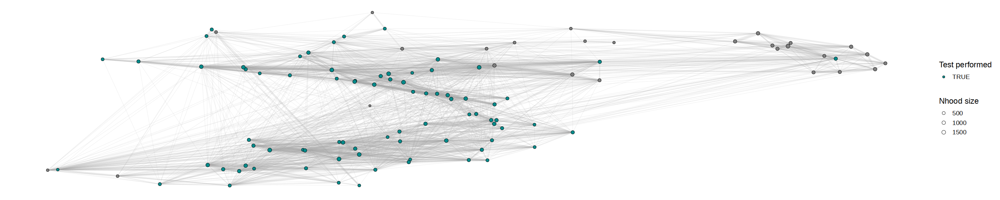

In [33]:
de_stat = de_test_neighbourhoods(sce_milo ,
                             sample_id = "sample",
                             design = ~ tdTom_corr,
                             covariates = c("tdTom_corr"), # why covariate same as design?
                             min_count = 150,
                             subset_nhoods = stat_auc$Nhood[!is.na(stat_auc$auc)],
                             output_type = "SCE",
                             plot_summary_stat = TRUE,
                             layout = "UMAP", BPPARAM = mcparam, 
                             verbose = T)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


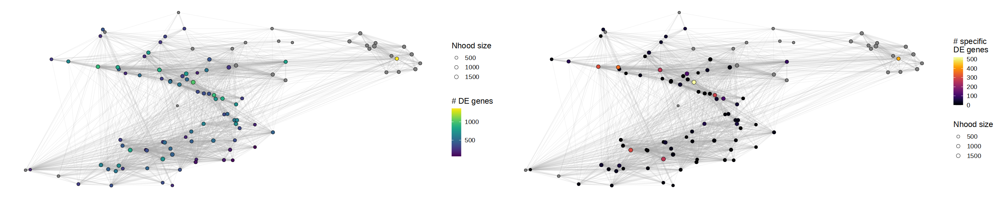

In [34]:
stat_de_magnitude = rank_neighbourhoods_by_DE_magnitude(de_stat)

p1 = plot_milo_by_single_metric(sce_milo, stat_de_magnitude, colour_by = "n_DE_genes" , 
                                      layout = "UMAP" , size_range = c(1.5,3) , edge_width = c(0.2,0.5)) + 
  scale_fill_viridis(name = "# DE genes")
#> Warning in plot_milo_by_single_metric(sce_milo, stat_de_magnitude, colour_by =
#> "n_DE_genes", : Coercing layout to matrix format
#> Scale for 'fill' is already present. Adding another scale for 'fill', which
#> will replace the existing scale.
p2 = plot_milo_by_single_metric(sce_milo, stat_de_magnitude, colour_by = "n_specific_DE_genes" , 
                                      layout = "UMAP" , size_range = c(1.5,3) , edge_width = c(0.2,0.5)) + 
  scale_fill_viridis(name = "# specific\nDE genes" , option = "inferno")
#> Warning in plot_milo_by_single_metric(sce_milo, stat_de_magnitude, colour_by =
#> "n_specific_DE_genes", : Coercing layout to matrix format
#> Scale for 'fill' is already present. Adding another scale for 'fill', which
#> will replace the existing scale.
p = ggarrange(p1,p2)
p

Warning message in mclapply(genes, function(gene) {:
“scheduled core 1 encountered error in user code, all values of the job will be affected”
Warning message in as_grob.default(plot):
“Cannot convert object of class try-error into a grob.”


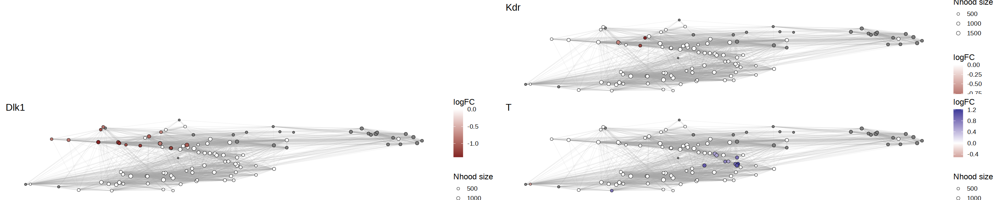

In [35]:
genes = c('Mixl1', 'Kdr', 'Dlk1', 'T')
plots = mclapply(genes , function(gene){
  p = plot_DE_single_gene(sce_milo, de_stat , gene = gene , layout = "UMAP" , set_na_to_0 = TRUE) + 
    ggtitle(gene)
  return(p)
}, mc.cores=4)

p = ggarrange(plotlist = plots, ncol=2, nrow=2)
p

In [36]:
get_wgcna_modules = function(de_stat , subset_hoods = NULL , 
                             n_hoods_sig.thresh = 2 ,
                             npcs = 5 ,
                             pval.thresh = 0.1 ){
  require(scWGCNA)
  require(Seurat)
  require(dplyr)
  require(reshape2)
  
  set.seed(32)
  # subset hoods
  if (!is.null(subset_hoods)){
    de_stat = de_stat[de_stat$Nhood %in% subset_hoods , ]
  }
  
  # focus on genes that DE in at least 2 nhoods
  de_stat_per_gene = as.data.frame(de_stat %>% group_by(gene) %>% dplyr::summarise(n_hoods_sig = sum(pval_corrected_across_nhoods < pval.thresh , na.rm = TRUE)))
  genes_sig = de_stat_per_gene$gene[de_stat_per_gene$n_hoods_sig >= n_hoods_sig.thresh]
  
  de_stat = de_stat[de_stat$gene %in% genes_sig, ]
  de_stat = de_stat[order(de_stat$Nhood) , ]
  
  # discard neighbourhoods in which testing was not performed
  de_stat = de_stat[de_stat$test_performed , ]
  
  # for this analysis, set logFC to 0 and pvals to 1 if they are NaN
  de_stat$logFC[is.na(de_stat$logFC)] = 0
  de_stat$pval[is.na(de_stat$pval)] = 1
  de_stat$pval_corrected_across_genes[is.na(de_stat$pval_corrected_across_genes)] = 1
  de_stat$pval_corrected_across_nhoods[is.na(de_stat$pval_corrected_across_nhoods)] = 1
  
  # set logFC to 0 if pval_corrected_across_nhoods > pval.thresh
  de_stat$logFC[de_stat$pval_corrected_across_nhoods >= pval.thresh] = 0
  
  # move the object to Seurat
  de_stat = reshape2::dcast(data = de_stat, formula = gene~Nhood, value.var = "logFC")
  rownames(de_stat) = de_stat$gene
  de_stat = de_stat[,2:ncol(de_stat)]
  
  obj.seurat <- CreateSeuratObject(counts = de_stat)
  DefaultAssay(obj.seurat) <- "RNA"
  obj.seurat = FindVariableFeatures(obj.seurat)
  # scale
  obj.seurat[["RNA"]]@scale.data = as.matrix(obj.seurat[["RNA"]]@data)
  obj.seurat = RunPCA(obj.seurat , npcs = npcs)
  
  # run scwgcna
  clusters_scwgcna = run.scWGCNA(p.cells = obj.seurat, 
                                 s.cells = obj.seurat, 
                                 is.pseudocell = F, 
                                 features = rownames(obj.seurat),
                                 less = TRUE , merging = TRUE)
  # compile stat
  clusters = lapply(1:length(clusters_scwgcna$module.genes) , function(i){
    out = data.frame(cluster = i , gene = clusters_scwgcna$module.genes[[i]] , n_genes = length(clusters_scwgcna$module.genes[[i]]))
    return(out)
  })
  clusters = do.call(rbind , clusters)
  # add colors
  genes_w_colors = clusters_scwgcna$dynamicCols
  genes_w_colors = data.frame(gene = names(genes_w_colors) , cluster_color = genes_w_colors)
  clusters = merge(clusters , genes_w_colors)
  
  return(clusters)
}


Warning message in eval(predvars, data, env):
“NaNs produced”
Warning message in hvf.info$variance.expected[not.const] <- 10^fit$fitted:
“number of items to replace is not a multiple of replacement length”


[1] "We have 1550 genes in the variable genes object"


Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”
Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'y'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


   Power SFT.R.sq  slope truncated.R.sq mean.k. median.k. max.k.
1      1   0.0397   7.41          0.860 776.000  776.0000  803.0
2      2   0.5100 -12.50          0.813 412.000  407.0000  468.0
3      3   0.7100  -6.56          0.912 229.000  223.0000  299.0
4      4   0.6810  -4.43          0.902 134.000  127.0000  208.0
5      5   0.7200  -3.53          0.924  81.300   75.3000  154.0
6      6   0.7450  -3.04          0.929  51.600   46.0000  120.0
7      7   0.8010  -2.66          0.958  34.100   29.1000   97.8
8      8   0.7740  -2.62          0.936  23.400   18.8000   81.9
9      9   0.8040  -2.41          0.953  16.600   12.7000   70.0
10    10   0.8260  -2.28          0.964  12.200    8.6800   60.9
11    12   0.8320  -2.17          0.951   7.050    4.3500   47.5
12    14   0.8290  -2.10          0.934   4.450    2.3700   38.1
13    16   0.3330  -3.18          0.303   2.980    1.3500   31.2
14    18   0.3400  -3.09          0.312   2.100    0.8410   25.9
15    20   0.3450  -2.98 

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9959  .... my.Clsize:  15"
150 genes not assigned to any module.
121 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9952  .... my.Clsize:  15"
55 genes not assigned to any module.
60 genes excluded due to significance.

IMPORTANT NOTE!!!
You have run this analysis witht the option less=TRUE. If a module seems to be highly expressed in only 1-3 cells ( cells expressing >2*(max(expression)/3) ), it will be removed.


Warning message in min(x, na.rm = T):
“no non-missing arguments to min; returning Inf”



Info: Some clusters will be merged
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 31 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 22 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 22 module eigengenes in given set.
The following modules were only highly expressed in less than 3 cells :  darkorange, darkturquoise, greenyellow, lightyellow, magenta, midnightblue, orange, royalblue, skyblue
They will all be removed

This is the result of the filtering.
The color of the modules does not correspond between original and filtered
TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (syst

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9952  .... my.Clsize:  29"


IMPORTANT NOTE!!!
You have run this analysis witht the option merging=TRUE. This means that based on their expression pattern, modules with similar expression profile (distance < 0.25) be merged during the iterations.
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 14 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 13 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 13 module eigengenes in given set.
48 genes not assigned to any module.
9 genes ex

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9953  .... my.Clsize:  21"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 13 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 10 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 10 module eigengenes in given set.
0 genes not assigned to any module.
19 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9952  .... my.Clsize:  17"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 14 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 12 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 12 module eigengenes in given set.
0 genes not assigned to any module.
14 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9951  .... my.Clsize:  17"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 14 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 12 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 12 module eigengenes in given set.
0 genes not assigned to any module.
1 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9951  .... my.Clsize:  17"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 14 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 12 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 12 module eigengenes in given set.
0 genes not assigned to any module.
0 genes excluded due to significance.

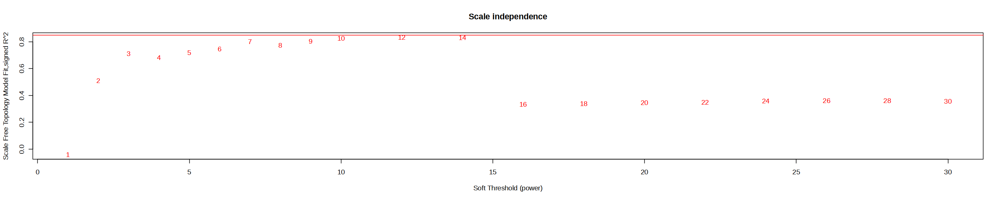

In [37]:
# for this vignette, for simplicity we will focus on genes that are DE in at least 4 neighbourhoods
modules_wgcna = suppressMessages(get_wgcna_modules(convert_de_stat(de_stat) , n_hoods_sig.thresh = 3, pval.thresh = 0.1))

In [38]:
#fwrite(modules_wgcna, sprintf('%s/modules_wgcna.txt.gz', args$outdir))

In [39]:
plots = mclapply(sort(unique(modules_wgcna$cluster)) , function(cluster){
  p = plot_DE_gene_set(sce_milo, de_stat , genes = modules_wgcna$gene[modules_wgcna$cluster == cluster],
                            layout = "UMAP" , size_range = c(0.5,3) ,
                            node_stroke = 0.3, edge_width = c(0.2,0.5)) +
    ggtitle(paste0("Module ", cluster, ", ", length(modules_wgcna$gene[modules_wgcna$cluster == cluster]) , " genes"))
  return(p)
}, mc.cores=10)

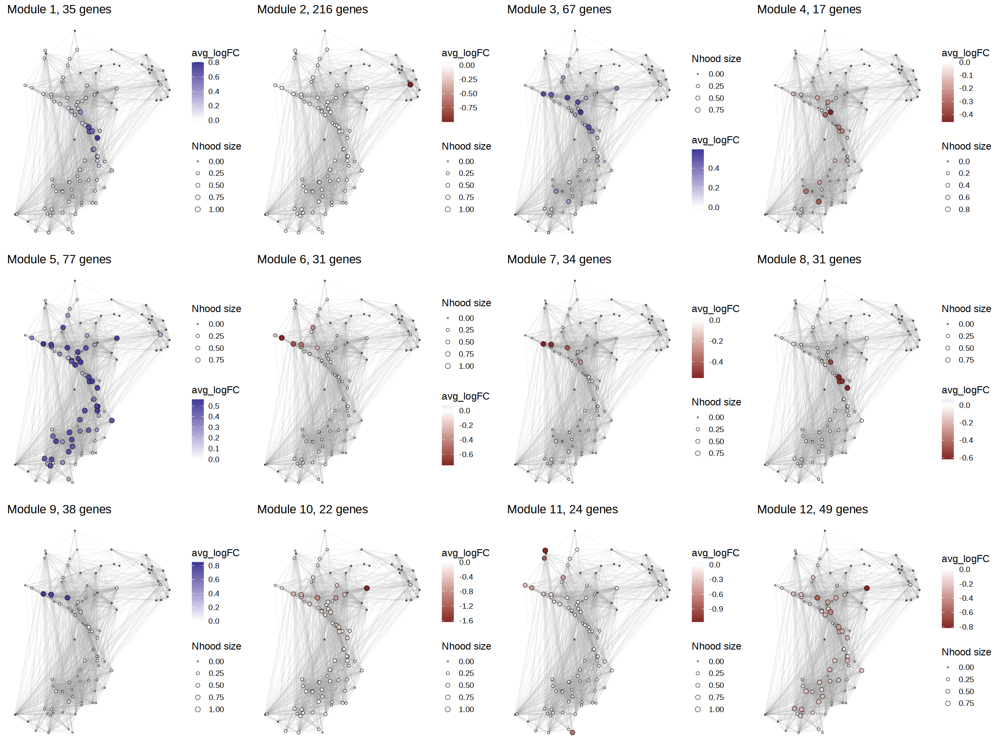

In [40]:
options(repr.plot.height=15, repr.plot.width=20)
p = ggarrange(plotlist = plots)
p

Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.


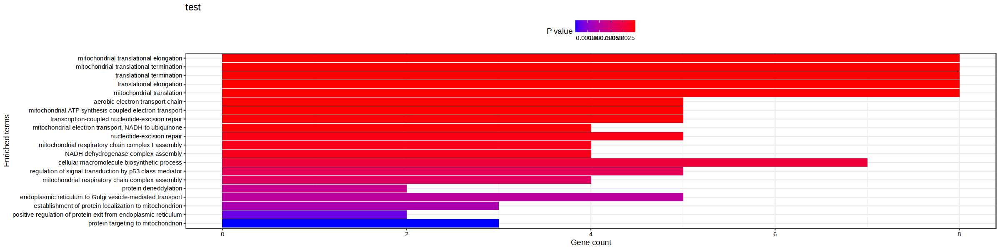

Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.


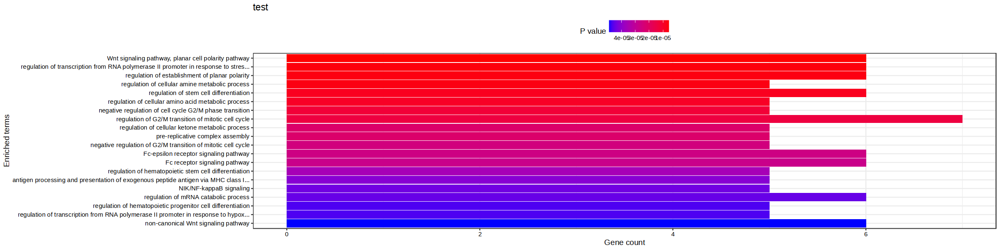

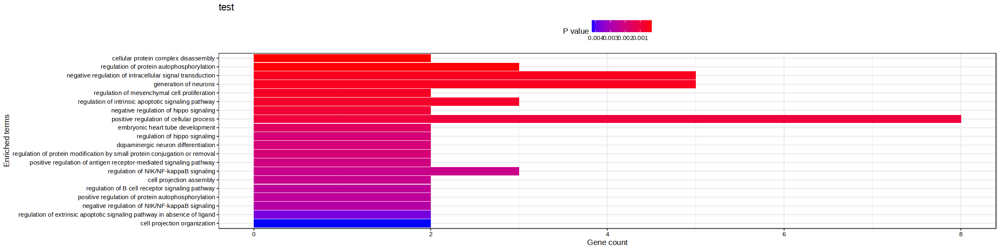

In [83]:
options(repr.plot.height=5, repr.plot.width=20)


current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster %in% c(5),]$gene)
# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster %in% c(3, 9),]$gene)
# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster %in% c(6, 7),]$gene)
# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.


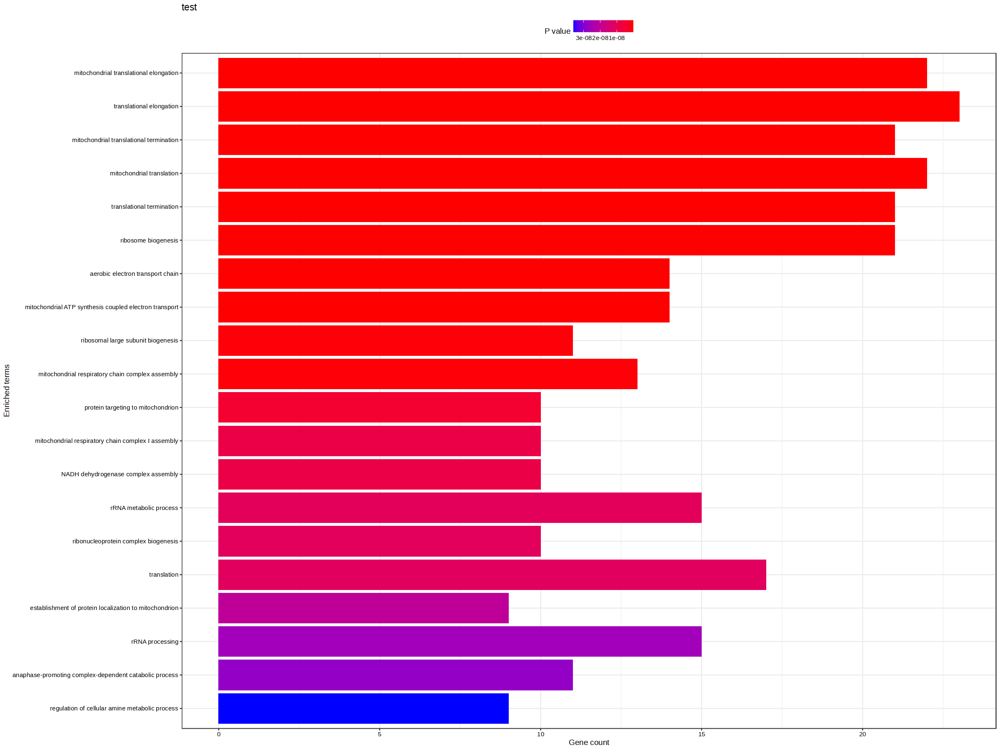

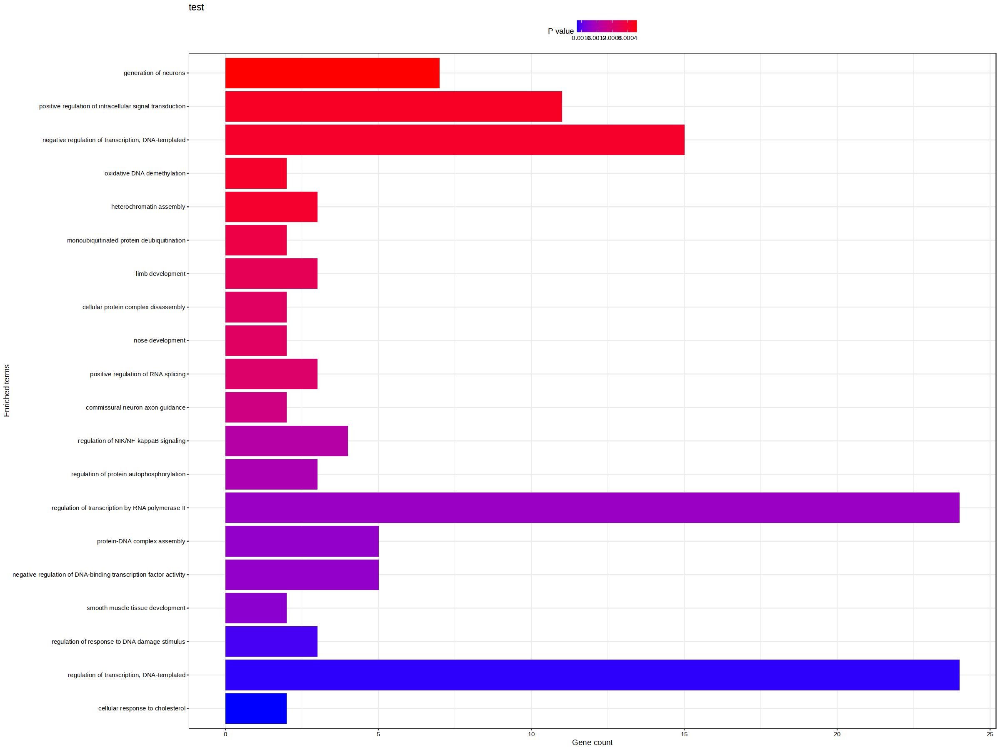

In [43]:
current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster %in% c(2,3),]$gene)
# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster %in% c(6, 7, 12, 15, 16),]$gene)
# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

Converting de_stat to 'data.frame' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format



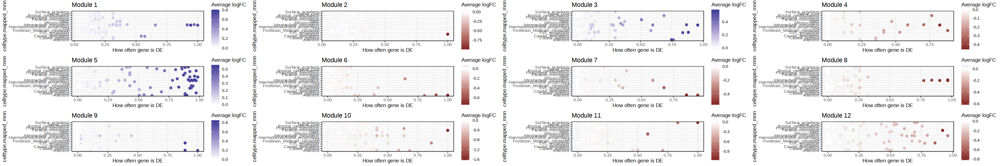

In [44]:
# we first need to assign cell type label to each neighbourhood - we have calculated it previously
# we will use data.frame format for de-stat; the conversion between SingleCellExperiment and data.frame formats can be done using `convert_de_stat`
de_stat_df = convert_de_stat(de_stat)
#> Converting de_stat to 'data.frame' format
de_stat_df = merge(de_stat_df , nhood_stat_ct , by = c("Nhood" , "Nhood_center"))


plots = lapply(sort(unique(modules_wgcna$cluster)) , function(cluster){
  p = plot_beeswarm_gene_set(de_stat_df, 
                             genes = modules_wgcna$gene[modules_wgcna$cluster == cluster], 
                             nhoodGroup = "celltype.mapped_mnn") + 
    ggtitle(paste0("Module ", cluster))
  return(p)
})
p = ggarrange(plotlist = plots)
options(repr.plot.height=5, repr.plot.width=30)
p

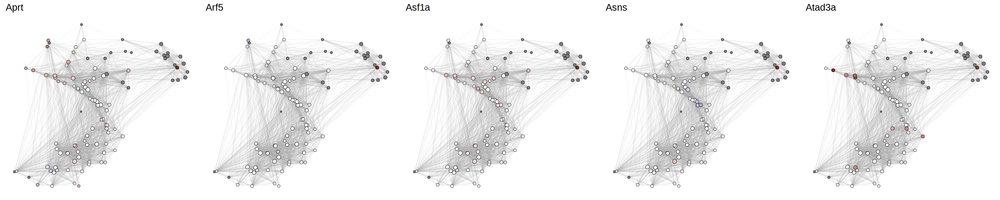

$`1`

$`2`

$`3`

attr(,"class")
[1] "list"      "ggarrange"

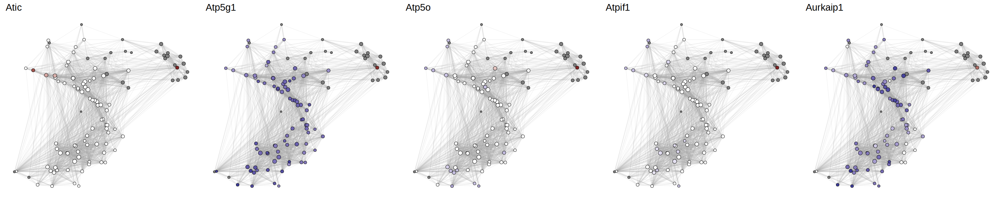

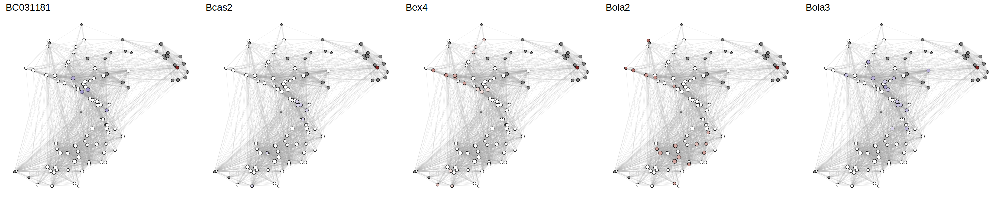

In [45]:
genes = head(modules_wgcna[modules_wgcna$cluster == 2,]$gene, 15)

plots = mclapply(genes , function(gene){
  p = suppressWarnings(plot_DE_single_gene(sce_milo, de_stat , gene = gene , layout = "UMAP" , set_na_to_0 = TRUE)) + 
    ggtitle(gene) + theme(legend.position='none')
  return(p)
}, mc.cores=15)

options(repr.plot.height=5, repr.plot.width=25)
p = ggarrange(plotlist = plots , ncol = 5) 
p

Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.


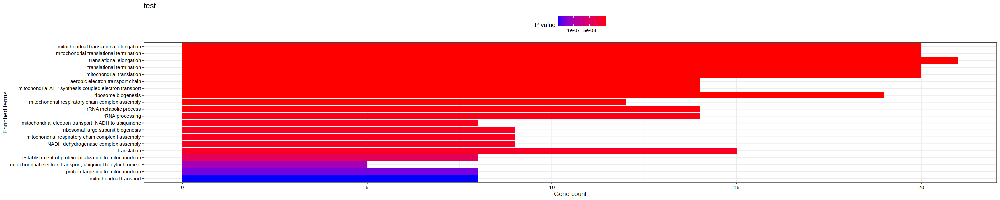

Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.


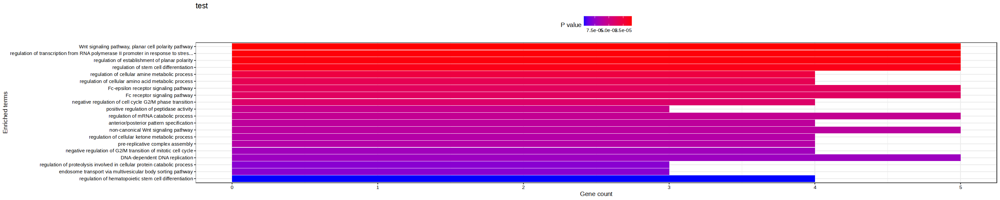

Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.


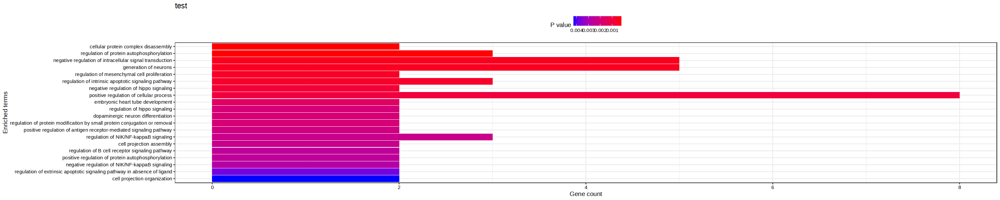

Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.


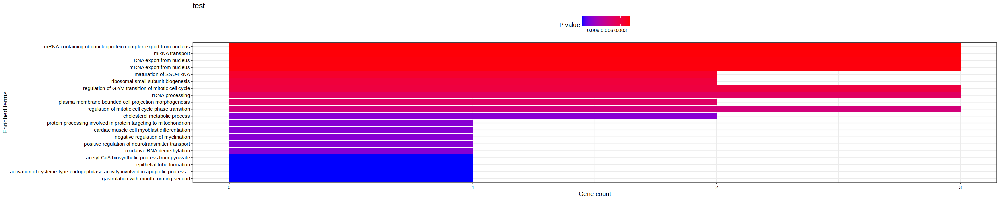

No genes have been given



ERROR: Error in `$<-.data.frame`(`*tmp*`, "n_tested_genes", value = 0L): replacement has 1 row, data has 0


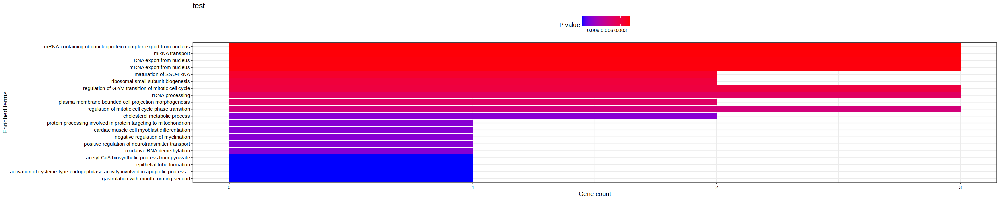

In [46]:
# output also says which genes belong to each ontology
get_go_terms = function(genes){
  library(enrichR)
  library(stringr)
  gos <- as.data.frame( enrichr(genes, 'GO_Biological_Process_2021')[[1]] )
  gos$n_tested_genes = length(genes)
  gos$n_detected_genes_in_go = NaN
  gos$n_total_genes_in_go = NaN
  gos$Term_id = NaN
  for (i in 1:nrow(gos)){
    current.overlap = gos$Overlap[i]
    current.overlap = str_split(current.overlap, '/')
    gos$n_detected_genes_in_go[i] = as.numeric(current.overlap[[1]][1])
    gos$n_total_genes_in_go[i] = as.numeric(current.overlap[[1]][2])
    current.go = gos$Term[i]
    current.go = str_split(current.go, 'GO:')
    gos$Term[i] = substring(current.go[[1]][1], 1, nchar(current.go[[1]][1])-2)
    gos$Term_id[i] = substring(current.go[[1]][2], 1, nchar(current.go[[1]][2])-1)
  }
  return(gos)
}

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster == 2,]$gene)

# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster == 3,]$gene)

# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster %in% c(6, 7, 15),]$gene)

# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster == 9,]$gene)

# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster == 12,]$gene)

# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster == 17,]$gene)

# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p

In [ ]:
current.gos = get_go_terms(modules_wgcna[modules_wgcna$cluster == 11,]$gene)

# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle('test') +
      theme(legend.position = 'top')
p